In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/ishitachaple/plant-disease-dataset/valid/Tomato/Early Blight/a3d07302-420d-4b4e-94f2-6694ef9d2088___RS_Erly.B 7652.JPG
/kaggle/input/datasets/ishitachaple/plant-disease-dataset/valid/Tomato/Early Blight/dc6eeebe-ebc4-406c-b5df-f4861f491db8___RS_Erly.B 9615_180deg.JPG
/kaggle/input/datasets/ishitachaple/plant-disease-dataset/valid/Tomato/Early Blight/bef16984-17c5-4796-9496-85808dfa3a56___RS_Erly.B 9405.JPG
/kaggle/input/datasets/ishitachaple/plant-disease-dataset/valid/Tomato/Early Blight/9744fa97-16b3-4a16-afc0-c86ac0397759___RS_Erly.B 6411_flipTB.JPG
/kaggle/input/datasets/ishitachaple/plant-disease-dataset/valid/Tomato/Early Blight/e332b0b1-ed0c-49b0-aad2-da29a8636126___RS_Erly.B 9418.JPG
/kaggle/input/datasets/ishitachaple/plant-disease-dataset/valid/Tomato/Early Blight/a8b2bbbc-5bef-4ef4-8322-48cde639a9aa___RS_Erly.B 7438_flipTB.JPG
/kaggle/input/datasets/ishitachaple/plant-disease-dataset/valid/Tomato/Early Blight/8039671d-c264-49aa-bfbc-81fabe24b007___RS_E

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam



2026-04-25 19:50:40.564394: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777146640.964404      23 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777146641.104049      23 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777146642.031574      23 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777146642.031629      23 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777146642.031632      23 computation_placer.cc:177] computation placer alr

In [3]:
import os
print(os.listdir("/kaggle/input"))



['datasets']


In [4]:
DATASET_ROOT = "/kaggle/input/datasets"
print(os.listdir(DATASET_ROOT))


['ishitachaple']


In [5]:
import os

print("ishitachaple:", os.listdir("/kaggle/input/datasets/ishitachaple"))


ishitachaple: ['plant-disease-dataset']


In [6]:
DATASET_ROOT = "/kaggle/input/datasets/ishitachaple/plant-disease-dataset"

TRAIN_PATH = DATASET_ROOT + "/train/Apple"
VAL_PATH   = DATASET_ROOT + "/valid/Apple"


In [7]:
import os
print(os.listdir(TRAIN_PATH))


['Healthy', 'Apple Scab', 'Cedar Apple Rust', 'Black Rot']


In [8]:
import os
print(os.listdir("/kaggle/input/datasets/ishitachaple/plant-disease-dataset"))


['valid', 'test', 'train']


Applying INCEPTION MODEL

Preprocessing

In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import preprocess_input

IMG_SIZE = 299
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_data = train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True
)

val_data = val_datagen.flow_from_directory(
    VAL_PATH,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

print(train_data.class_indices)
NUM_CLASSES = len(train_data.class_indices)

Found 7771 images belonging to 4 classes.
Found 1943 images belonging to 4 classes.
{'Apple Scab': 0, 'Black Rot': 1, 'Cedar Apple Rust': 2, 'Healthy': 3}


InceptionV3 with BatchNorm frozen

In [10]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def create_model():
    base_model = InceptionV3(
        weights="imagenet",
        include_top=False,
        input_shape=(IMG_SIZE, IMG_SIZE, 3)
    )

    # Freeze most layers, and freeze BatchNorm (important)
    for layer in base_model.layers:
        if isinstance(layer, tf.keras.layers.BatchNormalization):
            layer.trainable = False
        else:
            layer.trainable = False  # start fully frozen

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation="relu")(x)
    x = Dropout(0.5)(x)
    out = Dense(NUM_CLASSES, activation="softmax")(x)

    model = Model(inputs=base_model.input, outputs=out)
    model.compile(
        optimizer=Adam(1e-4),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    return model

Centralized Training (sanity check)

In [11]:
model = create_model()
history = model.fit(train_data, validation_data=val_data, epochs=5)
loss, acc = model.evaluate(val_data)
print("Centralized accuracy:", acc)

I0000 00:00:1777146684.502354      23 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5


I0000 00:00:1777146700.927266      81 service.cc:152] XLA service 0x78e0f0459aa0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1777146700.927308      81 service.cc:160]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1777146703.518194      81 cuda_dnn.cc:529] Loaded cuDNN version 91002


  2/243 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.2734 - loss: 1.6235   

I0000 00:00:1777146712.492172      81 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


243/243 ━━━━━━━━━━━━━━━━━━━━ 229s 865ms/step - accuracy: 0.6053 - loss: 0.9441 - val_accuracy: 0.9104 - val_loss: 0.3440
Epoch 2/5
243/243 ━━━━━━━━━━━━━━━━━━━━ 158s 652ms/step - accuracy: 0.8991 - loss: 0.3194 - val_accuracy: 0.9285 - val_loss: 0.2503
Epoch 3/5
243/243 ━━━━━━━━━━━━━━━━━━━━ 155s 636ms/step - accuracy: 0.9305 - loss: 0.2194 - val_accuracy: 0.9521 - val_loss: 0.1733
Epoch 4/5
243/243 ━━━━━━━━━━━━━━━━━━━━ 155s 636ms/step - accuracy: 0.9491 - loss: 0.1691 - val_accuracy: 0.9604 - val_loss: 0.1558
Epoch 5/5
243/243 ━━━━━━━━━━━━━━━━━━━━ 154s 635ms/step - accuracy: 0.9522 - loss: 0.1521 - val_accuracy: 0.9619 - val_loss: 0.1297
61/61 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - accuracy: 0.9523 - loss: 0.1593
Centralized accuracy: 0.9619145393371582


In [12]:
import numpy as np

# True labels from validation generator
y_true = val_data.classes

# Predict probabilities
y_pred_probs = model.predict(val_data)

# Convert to class indices
y_pred = np.argmax(y_pred_probs, axis=1)

61/61 ━━━━━━━━━━━━━━━━━━━━ 18s 203ms/step


In [13]:
from sklearn.metrics import accuracy_score

acc = accuracy_score(y_true, y_pred)
print("Accuracy:", acc)

Accuracy: 0.961914565105507


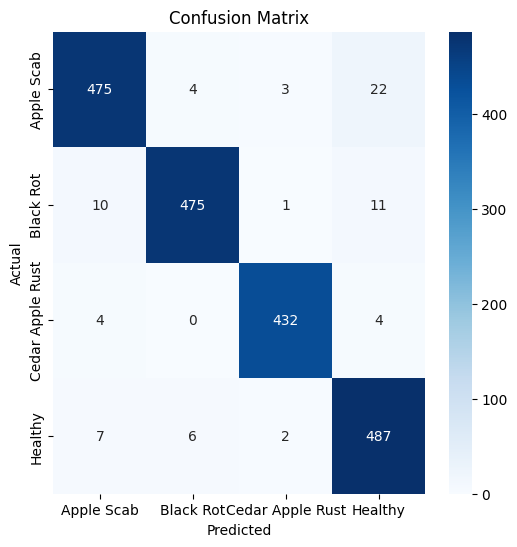

In [14]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt='d',
            xticklabels=val_data.class_indices.keys(),
            yticklabels=val_data.class_indices.keys(),
            cmap='Blues')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [15]:
from sklearn.metrics import classification_report

print(classification_report(
    y_true,
    y_pred,
    target_names=val_data.class_indices.keys()
))

                  precision    recall  f1-score   support

      Apple Scab       0.96      0.94      0.95       504
       Black Rot       0.98      0.96      0.97       497
Cedar Apple Rust       0.99      0.98      0.98       440
         Healthy       0.93      0.97      0.95       502

        accuracy                           0.96      1943
       macro avg       0.96      0.96      0.96      1943
    weighted avg       0.96      0.96      0.96      1943



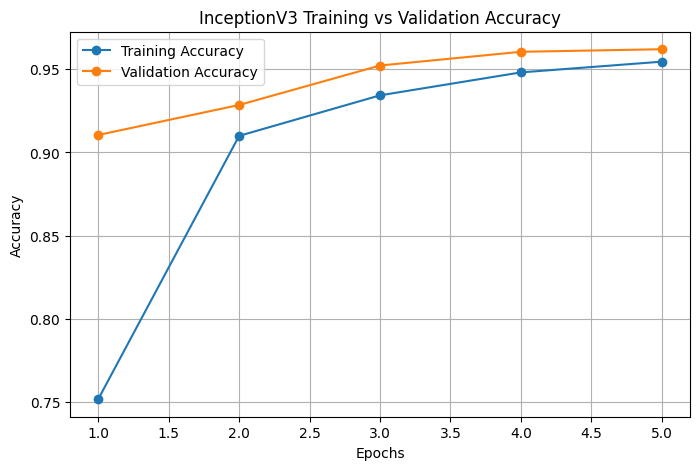

In [16]:
import matplotlib.pyplot as plt

# Training accuracy
train_acc = history.history['accuracy']

# Validation accuracy
val_acc = history.history['val_accuracy']

epochs = range(1, len(train_acc) + 1)

plt.figure(figsize=(8,5))

plt.plot(epochs, train_acc, marker='o', label='Training Accuracy')
plt.plot(epochs, val_acc, marker='o', label='Validation Accuracy')

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("InceptionV3 Training vs Validation Accuracy")

plt.legend()
plt.grid()

plt.show()

Build Federated Datasets 
stratified splitting by class

num of clients = 3

In [17]:
import numpy as np
import tensorflow as tf
from collections import defaultdict
from tensorflow.keras.applications.inception_v3 import preprocess_input

# Extract filepaths and labels from centralized generator
filepaths = np.array(train_data.filepaths)
labels = np.array(train_data.classes)

num_clients = 3

# --------------------------------------
# 1️⃣ Group indices by class (stratified)
# --------------------------------------
class_to_indices = defaultdict(list)

for idx, label in enumerate(labels):
    class_to_indices[label].append(idx)

# Shuffle indices within each class
for label in class_to_indices:
    np.random.shuffle(class_to_indices[label])

# --------------------------------------
# 2️⃣ Split each class equally among clients
# --------------------------------------
client_indices = [[] for _ in range(num_clients)]

for label, idxs in class_to_indices.items():
    splits = np.array_split(idxs, num_clients)
    for client_id in range(num_clients):
        client_indices[client_id].extend(splits[client_id])

# --------------------------------------
# 3️⃣ Dataset creation function
# --------------------------------------
def make_dataset(paths, labs):
    ds = tf.data.Dataset.from_tensor_slices((paths, labs))

    def load_preprocess(path, label):
        img = tf.io.read_file(path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
        img = preprocess_input(img)   # IMPORTANT for Inception
        label = tf.one_hot(label, NUM_CLASSES)
        return img, label

    ds = ds.map(load_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.shuffle(1000)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds

# --------------------------------------
# 4️⃣ Build client datasets
# --------------------------------------
client_datasets = []

for i in range(num_clients):
    idx = np.array(client_indices[i])
    client_datasets.append(make_dataset(filepaths[idx], labels[idx]))

FedProx Training

In [18]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

def fedprox_train(client_datasets, rounds=8, local_epochs=1, mu=0.001):

    global_model = create_model()
    global_weights = global_model.get_weights()

    train_acc_list = []
    val_acc_list = []

    for r in range(rounds):

        print(f"\n--- Round {r+1} ---")
        client_weights = []

        for i, ds in enumerate(client_datasets):

            print(f"Client {i+1} training...")

            client_model = create_model()
            client_model.set_weights(global_weights)

            optimizer = Adam(1e-4)

            for _ in range(local_epochs):
                for x, y in ds:

                    with tf.GradientTape() as tape:

                        preds = client_model(x, training=True)

                        ce_loss = tf.keras.losses.categorical_crossentropy(y, preds)
                        ce_loss = tf.reduce_mean(ce_loss)

                        prox = 0.0
                        for w, w0 in zip(client_model.trainable_weights,
                                         global_model.trainable_weights):
                            prox += tf.reduce_sum(tf.square(w - w0))

                        loss = ce_loss + (mu / 2.0) * prox

                    grads = tape.gradient(loss, client_model.trainable_weights)
                    optimizer.apply_gradients(zip(grads, client_model.trainable_weights))

            client_weights.append(client_model.get_weights())

        # 🔹 Aggregation
        new_weights = []
        for weights in zip(*client_weights):
            new_weights.append(np.mean(weights, axis=0))

        global_weights = new_weights
        global_model.set_weights(global_weights)

        # 🔹 Evaluate after each round
        train_loss, train_acc = global_model.evaluate(train_data, verbose=0)
        val_loss, val_acc = global_model.evaluate(val_data, verbose=0)

        print(f"Round {r+1} → Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

        train_acc_list.append(train_acc)
        val_acc_list.append(val_acc)

    return global_model, train_acc_list, val_acc_list

In [19]:
fedprox_model, train_acc, val_acc = fedprox_train(
    client_datasets,
    rounds=8,
    local_epochs=1,
    mu=0.001
)

loss, acc = fedprox_model.evaluate(val_data)
print("Final FedProx Accuracy:", acc)


--- Round 1 ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 1 → Train Acc: 0.6939, Val Acc: 0.6552

--- Round 2 ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 2 → Train Acc: 0.8224, Val Acc: 0.8116

--- Round 3 ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 3 → Train Acc: 0.8554, Val Acc: 0.8626

--- Round 4 ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 4 → Train Acc: 0.8801, Val Acc: 0.8929

--- Round 5 ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 5 → Train Acc: 0.8864, Val Acc: 0.9074

--- Round 6 ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 6 → Train Acc: 0.9016, Val Acc: 0.9182

--- Round 7 ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 7 → Train Acc: 0.9166, Val Acc: 0.9300

--- Round 8 ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 8 → Train Acc: 0.9192, Val Acc: 0.9377


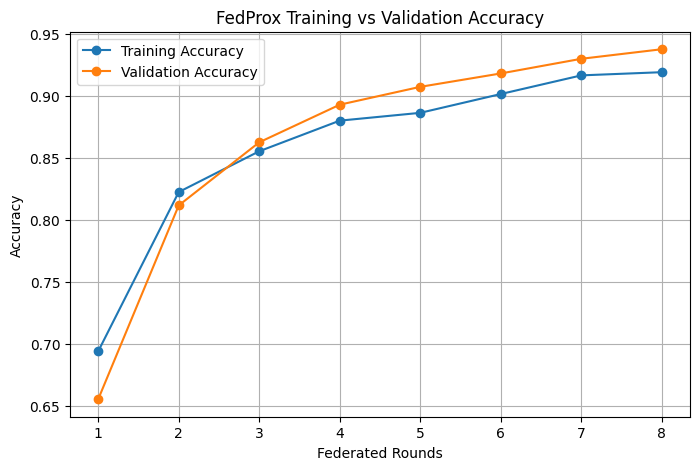

In [20]:
import matplotlib.pyplot as plt

rounds = range(1, len(train_acc) + 1)

plt.figure(figsize=(8,5))

plt.plot(rounds, train_acc, marker='o', label='Training Accuracy')
plt.plot(rounds, val_acc, marker='o', label='Validation Accuracy')

plt.xlabel("Federated Rounds")
plt.ylabel("Accuracy")
plt.title("FedProx Training vs Validation Accuracy")
plt.legend()
plt.grid()

plt.show()

In [21]:
import numpy as np

y_true = val_data.classes
y_pred_probs = fedprox_model.predict(val_data)
y_pred = np.argmax(y_pred_probs, axis=1)

61/61 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step


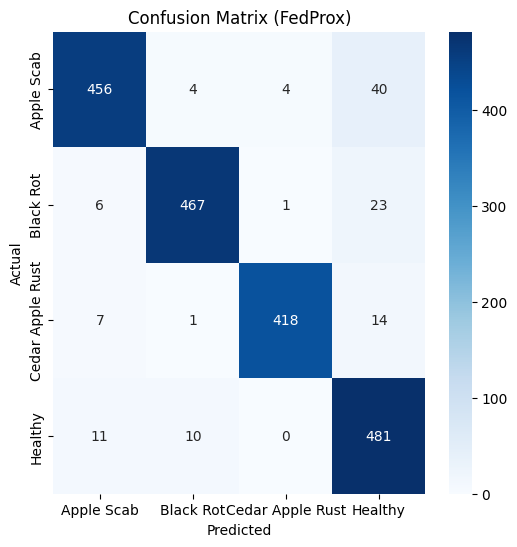

In [22]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt='d',
            xticklabels=val_data.class_indices.keys(),
            yticklabels=val_data.class_indices.keys(),
            cmap='Blues')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (FedProx)")
plt.show()

In [23]:
from sklearn.metrics import classification_report

print(classification_report(
    y_true,
    y_pred,
    target_names=list(val_data.class_indices.keys())
))

                  precision    recall  f1-score   support

      Apple Scab       0.95      0.90      0.93       504
       Black Rot       0.97      0.94      0.95       497
Cedar Apple Rust       0.99      0.95      0.97       440
         Healthy       0.86      0.96      0.91       502

        accuracy                           0.94      1943
       macro avg       0.94      0.94      0.94      1943
    weighted avg       0.94      0.94      0.94      1943



In [24]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Macro Precision:", precision_score(y_true, y_pred, average='macro'))
print("Macro Recall:", recall_score(y_true, y_pred, average='macro'))
print("Macro F1-score:", f1_score(y_true, y_pred, average='macro'))

Macro Precision: 0.9422666263848266
Macro Recall: 0.9381417656002417
Macro F1-score: 0.9392812391318489


num of clients = 9


In [25]:
import numpy as np
import tensorflow as tf
from collections import defaultdict
from tensorflow.keras.applications.inception_v3 import preprocess_input

# Extract filepaths and labels from centralized generator
filepaths = np.array(train_data.filepaths)
labels = np.array(train_data.classes)

num_clients = 9

# --------------------------------------
# 1️⃣ Group indices by class (stratified)
# --------------------------------------
class_to_indices = defaultdict(list)

for idx, label in enumerate(labels):
    class_to_indices[label].append(idx)

# Shuffle indices within each class
for label in class_to_indices:
    np.random.shuffle(class_to_indices[label])

# --------------------------------------
# 2️⃣ Split each class equally among clients
# --------------------------------------
client_indices = [[] for _ in range(num_clients)]

for label, idxs in class_to_indices.items():
    splits = np.array_split(idxs, num_clients)
    for client_id in range(num_clients):
        client_indices[client_id].extend(splits[client_id])

# --------------------------------------
# 3️⃣ Dataset creation function
# --------------------------------------
def make_dataset(paths, labs):
    ds = tf.data.Dataset.from_tensor_slices((paths, labs))

    def load_preprocess(path, label):
        img = tf.io.read_file(path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
        img = preprocess_input(img)   # IMPORTANT for Inception
        label = tf.one_hot(label, NUM_CLASSES)
        return img, label

    ds = ds.map(load_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.shuffle(1000)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds

# --------------------------------------
# 4️⃣ Build client datasets
# --------------------------------------
client_datasets = []

for i in range(num_clients):
    idx = np.array(client_indices[i])
    client_datasets.append(make_dataset(filepaths[idx], labels[idx]))

In [26]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

def fedprox_train(client_datasets, rounds=8, local_epochs=1, mu=0.001):

    global_model = create_model()
    global_weights = global_model.get_weights()

    train_acc_list = []
    val_acc_list = []

    for r in range(rounds):

        print(f"\n--- Round {r+1} ---")
        client_weights = []

        for i, ds in enumerate(client_datasets):

            print(f"Client {i+1} training...")

            client_model = create_model()
            client_model.set_weights(global_weights)

            optimizer = Adam(1e-4)

            for _ in range(local_epochs):
                for x, y in ds:

                    with tf.GradientTape() as tape:

                        preds = client_model(x, training=True)

                        ce_loss = tf.keras.losses.categorical_crossentropy(y, preds)
                        ce_loss = tf.reduce_mean(ce_loss)

                        prox = 0.0
                        for w, w0 in zip(client_model.trainable_weights,
                                         global_model.trainable_weights):
                            prox += tf.reduce_sum(tf.square(w - w0))

                        loss = ce_loss + (mu / 2.0) * prox

                    grads = tape.gradient(loss, client_model.trainable_weights)
                    optimizer.apply_gradients(zip(grads, client_model.trainable_weights))

            client_weights.append(client_model.get_weights())

        # 🔹 Aggregation
        new_weights = []
        for weights in zip(*client_weights):
            new_weights.append(np.mean(weights, axis=0))

        global_weights = new_weights
        global_model.set_weights(global_weights)

        # 🔹 Evaluate after each round
        train_loss, train_acc = global_model.evaluate(train_data, verbose=0)
        val_loss, val_acc = global_model.evaluate(val_data, verbose=0)

        print(f"Round {r+1} → Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

        train_acc_list.append(train_acc)
        val_acc_list.append(val_acc)

    return global_model, train_acc_list, val_acc_list

In [27]:
fedprox_model, train_acc, val_acc = fedprox_train(
    client_datasets,
    rounds=8,
    local_epochs=1,
    mu=0.001
)

loss, acc = fedprox_model.evaluate(val_data)
print("Final FedProx Accuracy:", acc)


--- Round 1 ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 1 → Train Acc: 0.6951, Val Acc: 0.7277

--- Round 2 ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 2 → Train Acc: 0.7890, Val Acc: 0.8492

--- Round 3 ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 3 → Train Acc: 0.8269, Val Acc: 0.8765

--- Round 4 ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 4 → Train Acc: 0.8488, Val Acc: 0.8

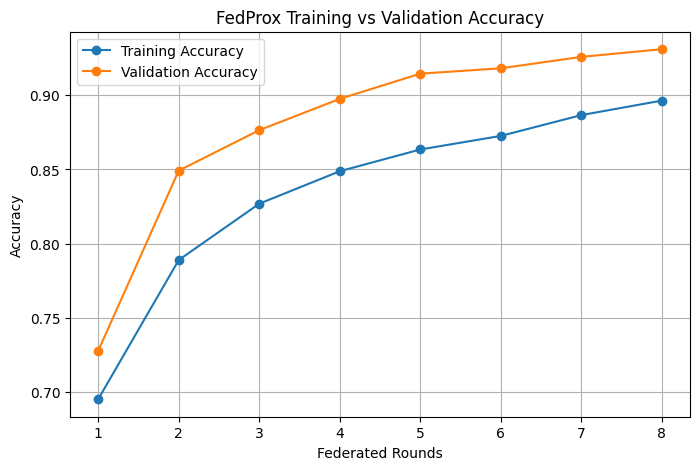

In [28]:
import matplotlib.pyplot as plt

rounds = range(1, len(train_acc) + 1)

plt.figure(figsize=(8,5))

plt.plot(rounds, train_acc, marker='o', label='Training Accuracy')
plt.plot(rounds, val_acc, marker='o', label='Validation Accuracy')

plt.xlabel("Federated Rounds")
plt.ylabel("Accuracy")
plt.title("FedProx Training vs Validation Accuracy")
plt.legend()
plt.grid()

plt.show()

In [29]:
import numpy as np

y_true = val_data.classes
y_pred_probs = fedprox_model.predict(val_data)
y_pred = np.argmax(y_pred_probs, axis=1)

61/61 ━━━━━━━━━━━━━━━━━━━━ 17s 182ms/step


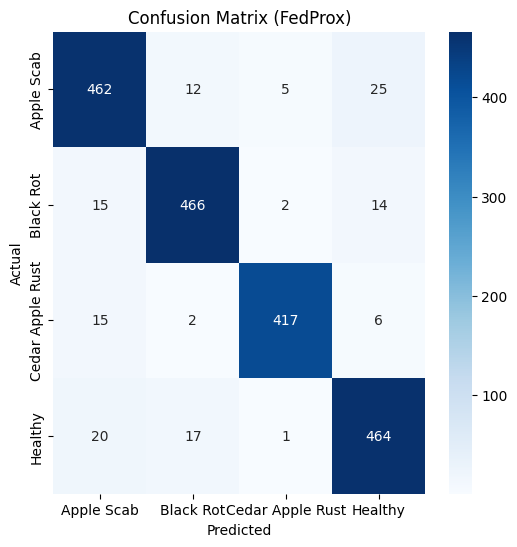

In [30]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt='d',
            xticklabels=val_data.class_indices.keys(),
            yticklabels=val_data.class_indices.keys(),
            cmap='Blues')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (FedProx)")
plt.show()

In [31]:
from sklearn.metrics import classification_report

print(classification_report(
    y_true,
    y_pred,
    target_names=list(val_data.class_indices.keys())
))

                  precision    recall  f1-score   support

      Apple Scab       0.90      0.92      0.91       504
       Black Rot       0.94      0.94      0.94       497
Cedar Apple Rust       0.98      0.95      0.96       440
         Healthy       0.91      0.92      0.92       502

        accuracy                           0.93      1943
       macro avg       0.93      0.93      0.93      1943
    weighted avg       0.93      0.93      0.93      1943



In [32]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Macro Precision:", precision_score(y_true, y_pred, average='macro'))
print("Macro Recall:", recall_score(y_true, y_pred, average='macro'))
print("Macro F1-score:", f1_score(y_true, y_pred, average='macro'))

Macro Precision: 0.9331843326786532
Macro Recall: 0.931580620691431
Macro F1-score: 0.9322848723517005


Fed Avg

number of clients

In [33]:
import numpy as np
import tensorflow as tf
from collections import defaultdict
from tensorflow.keras.applications.inception_v3 import preprocess_input

def create_clients(train_data, num_clients):

    filepaths = np.array(train_data.filepaths)
    labels = np.array(train_data.classes)

    # -------- Stratified grouping --------
    class_to_indices = defaultdict(list)

    for idx, label in enumerate(labels):
        class_to_indices[label].append(idx)

    for label in class_to_indices:
        np.random.shuffle(class_to_indices[label])

    # -------- Split into clients --------
    client_indices = [[] for _ in range(num_clients)]

    for label, idxs in class_to_indices.items():
        splits = np.array_split(idxs, num_clients)
        for client_id in range(num_clients):
            client_indices[client_id].extend(splits[client_id])

    # -------- Dataset function --------
    def make_dataset(paths, labs):
        ds = tf.data.Dataset.from_tensor_slices((paths, labs))

        def load_preprocess(path, label):
            img = tf.io.read_file(path)
            img = tf.image.decode_jpeg(img, channels=3)
            img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
            img = preprocess_input(img)
            label = tf.one_hot(label, NUM_CLASSES)
            return img, label

        ds = ds.map(load_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
        ds = ds.shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

        return ds

    # -------- Create datasets --------
    client_datasets = []

    for i in range(num_clients):
        idx = np.array(client_indices[i])
        client_datasets.append(make_dataset(filepaths[idx], labels[idx]))

    return client_datasets

no. of clients = 3

In [34]:
clients_3_fedavg = create_clients(train_data, num_clients=3)

fed avg training


In [35]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

def fedavg_train(client_datasets, rounds=8, local_epochs=1):

    global_model = create_model()
    global_weights = global_model.get_weights()

    train_acc_list = []
    val_acc_list = []

    for r in range(rounds):

        print(f"\n--- Round {r+1} (FedAvg) ---")

        client_weights = []

        for i, ds in enumerate(client_datasets):

            print(f"Client {i+1} training...")

            client_model = create_model()
            client_model.set_weights(global_weights)

            optimizer = Adam(1e-4)

            # Local training (NO proximal term)
            for _ in range(local_epochs):
                for x, y in ds:

                    with tf.GradientTape() as tape:

                        preds = client_model(x, training=True)

                        loss = tf.keras.losses.categorical_crossentropy(y, preds)
                        loss = tf.reduce_mean(loss)

                    grads = tape.gradient(loss, client_model.trainable_weights)
                    optimizer.apply_gradients(zip(grads, client_model.trainable_weights))

            client_weights.append(client_model.get_weights())

        # 🔹 Aggregate (average weights)
        new_weights = []
        for weights in zip(*client_weights):
            new_weights.append(np.mean(weights, axis=0))

        global_weights = new_weights
        global_model.set_weights(global_weights)

        # 🔹 Evaluate after each round
        train_loss, train_acc = global_model.evaluate(train_data, verbose=0)
        val_loss, val_acc = global_model.evaluate(val_data, verbose=0)

        print(f"Round {r+1} → Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

        train_acc_list.append(train_acc)
        val_acc_list.append(val_acc)

    return global_model, train_acc_list, val_acc_list

In [36]:
fedavg_model, train_acc_avg, val_acc_avg = fedavg_train(
    clients_3_fedavg,
    rounds=8,
    local_epochs=1
)


--- Round 1 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 1 → Train Acc: 0.7159, Val Acc: 0.7041

--- Round 2 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 2 → Train Acc: 0.8276, Val Acc: 0.8116

--- Round 3 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 3 → Train Acc: 0.8673, Val Acc: 0.8713

--- Round 4 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 4 → Train Acc: 0.8774, Val Acc: 0.8842

--- Round 5 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 5 → Train Acc: 0.8914, Val Acc: 0.9146

--- Round 6 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 6 → Train Acc: 0.9016, Val Acc: 0.9238

--- Round 7 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 7 → Train Acc: 0.9125, Val Acc: 0.9228

--- Round 8 (FedAvg) ---
Client 1 training...
Client 2 traini

In [37]:
loss, acc = fedavg_model.evaluate(val_data)
print("FedAvg Accuracy:", acc)

61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9022 - loss: 0.2795
FedAvg Accuracy: 0.9361811876296997


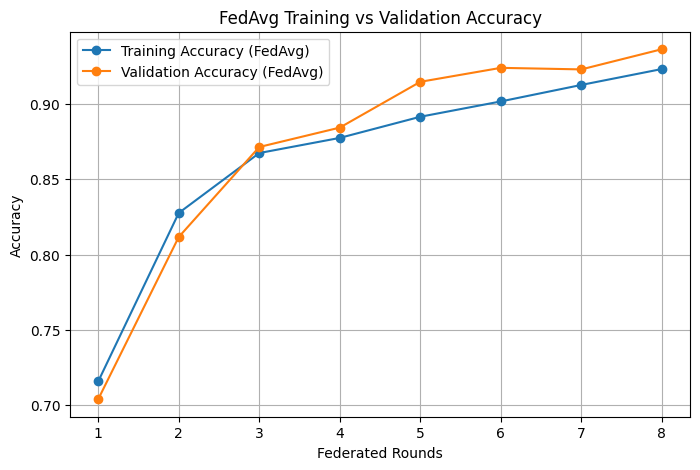

In [38]:
import matplotlib.pyplot as plt

rounds = range(1, len(train_acc_avg) + 1)

plt.figure(figsize=(8,5))

plt.plot(rounds, train_acc_avg, marker='o', label='Training Accuracy (FedAvg)')
plt.plot(rounds, val_acc_avg, marker='o', label='Validation Accuracy (FedAvg)')

plt.xlabel("Federated Rounds")
plt.ylabel("Accuracy")
plt.title("FedAvg Training vs Validation Accuracy")
plt.legend()
plt.grid()

plt.show()

In [39]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

y_true = val_data.classes
y_pred_probs = fedavg_model.predict(val_data)
y_pred = np.argmax(y_pred_probs, axis=1)

print(classification_report(
    y_true,
    y_pred,
    target_names=list(val_data.class_indices.keys())
))

61/61 ━━━━━━━━━━━━━━━━━━━━ 17s 195ms/step
                  precision    recall  f1-score   support

      Apple Scab       0.96      0.87      0.91       504
       Black Rot       0.97      0.93      0.95       497
Cedar Apple Rust       0.98      0.97      0.97       440
         Healthy       0.86      0.97      0.91       502

        accuracy                           0.94      1943
       macro avg       0.94      0.94      0.94      1943
    weighted avg       0.94      0.94      0.94      1943



In [40]:
import numpy as np

# True labels
y_true = val_data.classes

# Predicted probabilities
y_pred_probs = fedavg_model.predict(val_data)

# Convert to class indices
y_pred = np.argmax(y_pred_probs, axis=1)

61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step


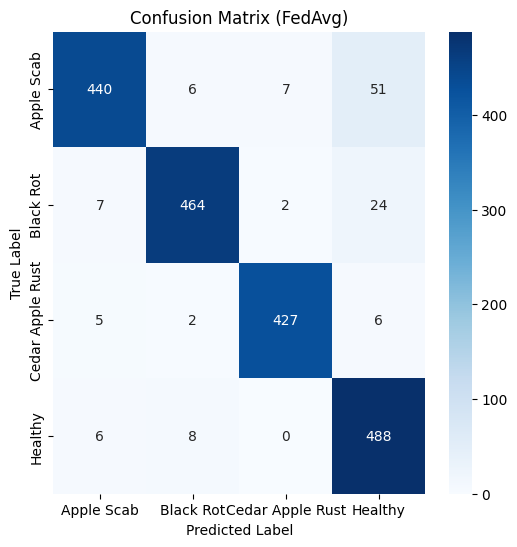

In [41]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,6))

sns.heatmap(cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=val_data.class_indices.keys(),
            yticklabels=val_data.class_indices.keys())

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (FedAvg)")

plt.show()

In [42]:
clients_9_fedavg = create_clients(train_data, num_clients=9)

In [43]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

def fedavg_train(client_datasets, rounds=8, local_epochs=1):

    global_model = create_model()
    global_weights = global_model.get_weights()

    train_acc_list = []
    val_acc_list = []

    for r in range(rounds):

        print(f"\n--- Round {r+1} (FedAvg) ---")

        client_weights = []

        for i, ds in enumerate(client_datasets):

            print(f"Client {i+1} training...")

            client_model = create_model()
            client_model.set_weights(global_weights)

            optimizer = Adam(1e-4)

            # Local training (NO proximal term)
            for _ in range(local_epochs):
                for x, y in ds:

                    with tf.GradientTape() as tape:

                        preds = client_model(x, training=True)

                        loss = tf.keras.losses.categorical_crossentropy(y, preds)
                        loss = tf.reduce_mean(loss)

                    grads = tape.gradient(loss, client_model.trainable_weights)
                    optimizer.apply_gradients(zip(grads, client_model.trainable_weights))

            client_weights.append(client_model.get_weights())

        # 🔹 Aggregate (average weights)
        new_weights = []
        for weights in zip(*client_weights):
            new_weights.append(np.mean(weights, axis=0))

        global_weights = new_weights
        global_model.set_weights(global_weights)

        # 🔹 Evaluate after each round
        train_loss, train_acc = global_model.evaluate(train_data, verbose=0)
        val_loss, val_acc = global_model.evaluate(val_data, verbose=0)

        print(f"Round {r+1} → Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

        train_acc_list.append(train_acc)
        val_acc_list.append(val_acc)

    return global_model, train_acc_list, val_acc_list

In [44]:
fedavg_model, train_acc_avg, val_acc_avg = fedavg_train(
    clients_9_fedavg,
    rounds=8,
    local_epochs=1
)


--- Round 1 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 1 → Train Acc: 0.6618, Val Acc: 0.7185

--- Round 2 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 2 → Train Acc: 0.8029, Val Acc: 0.8528

--- Round 3 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 3 → Train Acc: 0.8349, Val Acc: 0.8852

--- Round 4 (FedAvg) ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round

In [45]:
loss, acc = fedavg_model.evaluate(val_data)
print("FedAvg Accuracy:", acc)

61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.9334 - loss: 0.2708
FedAvg Accuracy: 0.9315491318702698


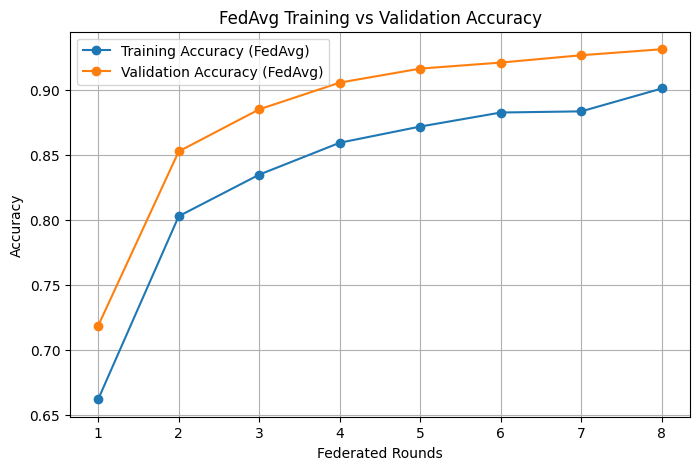

In [46]:
import matplotlib.pyplot as plt

rounds = range(1, len(train_acc_avg) + 1)

plt.figure(figsize=(8,5))

plt.plot(rounds, train_acc_avg, marker='o', label='Training Accuracy (FedAvg)')
plt.plot(rounds, val_acc_avg, marker='o', label='Validation Accuracy (FedAvg)')

plt.xlabel("Federated Rounds")
plt.ylabel("Accuracy")
plt.title("FedAvg Training vs Validation Accuracy")
plt.legend()
plt.grid()

plt.show()

In [47]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

y_true = val_data.classes
y_pred_probs = fedavg_model.predict(val_data)
y_pred = np.argmax(y_pred_probs, axis=1)

print(classification_report(
    y_true,
    y_pred,
    target_names=list(val_data.class_indices.keys())
))

61/61 ━━━━━━━━━━━━━━━━━━━━ 17s 190ms/step
                  precision    recall  f1-score   support

      Apple Scab       0.91      0.93      0.92       504
       Black Rot       0.94      0.94      0.94       497
Cedar Apple Rust       0.97      0.94      0.96       440
         Healthy       0.92      0.91      0.92       502

        accuracy                           0.93      1943
       macro avg       0.93      0.93      0.93      1943
    weighted avg       0.93      0.93      0.93      1943



In [48]:
import numpy as np

# True labels
y_true = val_data.classes

# Predicted probabilities
y_pred_probs = fedavg_model.predict(val_data)

# Convert to class indices
y_pred = np.argmax(y_pred_probs, axis=1)

61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step


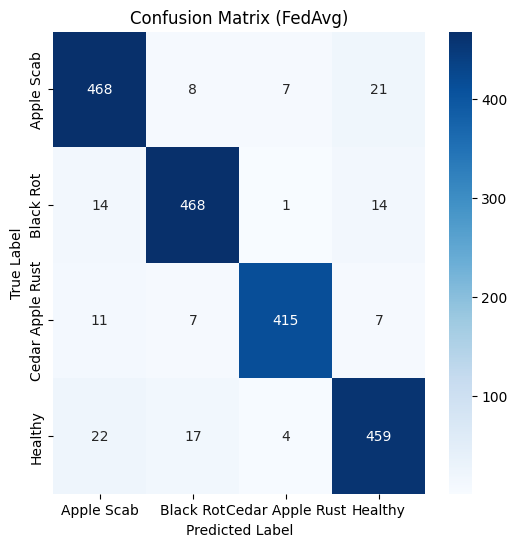

In [49]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,6))

sns.heatmap(cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=val_data.class_indices.keys(),
            yticklabels=val_data.class_indices.keys())

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (FedAvg)")

plt.show()

fedadam

In [50]:
clients = 3

In [51]:
clients_3_fedadam = create_clients(train_data, num_clients=3)

fedadam training

In [52]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

def fedadam_train(client_datasets, rounds=8, local_epochs=1, lr=1e-4):

    # 🔹 Global model
    global_model = create_model()
    global_weights = global_model.get_weights()

    # 🔹 Adam states (server-side)
    m = [np.zeros_like(w) for w in global_weights]  # first moment
    v = [np.zeros_like(w) for w in global_weights]  # second moment

    beta1 = 0.9
    beta2 = 0.999
    epsilon = 1e-8

    train_acc_list = []
    val_acc_list = []

    for r in range(rounds):

        print(f"\n--- Round {r+1} (FedAdam) ---")

        client_weights = []

        # 🔹 CLIENT TRAINING (same as FedAvg)
        for i, ds in enumerate(client_datasets):

            print(f"Client {i+1} training...")

            client_model = create_model()
            client_model.set_weights(global_weights)

            optimizer = Adam(1e-4)

            for _ in range(local_epochs):
                for x, y in ds:

                    with tf.GradientTape() as tape:
                        preds = client_model(x, training=True)
                        loss = tf.keras.losses.categorical_crossentropy(y, preds)
                        loss = tf.reduce_mean(loss)

                    grads = tape.gradient(loss, client_model.trainable_weights)
                    optimizer.apply_gradients(zip(grads, client_model.trainable_weights))

            client_weights.append(client_model.get_weights())

        # 🔹 AVERAGE CLIENT WEIGHTS
        avg_weights = []
        for weights in zip(*client_weights):
            avg_weights.append(np.mean(weights, axis=0))

        # 🔹 COMPUTE DELTA (difference)
        deltas = [avg - gw for avg, gw in zip(avg_weights, global_weights)]

        # 🔹 FEDADAM UPDATE (server-side)
        new_weights = []

        for i in range(len(global_weights)):

            # update moments
            m[i] = beta1 * m[i] + (1 - beta1) * deltas[i]
            v[i] = beta2 * v[i] + (1 - beta2) * (deltas[i] ** 2)

            # bias correction
            m_hat = m[i] / (1 - beta1 ** (r + 1))
            v_hat = v[i] / (1 - beta2 ** (r + 1))

            # update weights
            updated = global_weights[i] + lr * m_hat / (np.sqrt(v_hat) + epsilon)
            new_weights.append(updated)

        global_weights = new_weights
        global_model.set_weights(global_weights)

        # 🔹 Evaluation
        train_loss, train_acc = global_model.evaluate(train_data, verbose=0)
        val_loss, val_acc = global_model.evaluate(val_data, verbose=0)

        print(f"Round {r+1} → Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

        train_acc_list.append(train_acc)
        val_acc_list.append(val_acc)

    return global_model, train_acc_list, val_acc_list

In [53]:
fedadam_model_3, train_acc_3, val_acc_3 = fedadam_train(
    clients_3_fedadam,
    rounds=8,
    local_epochs=1
)


--- Round 1 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 1 → Train Acc: 0.3468, Val Acc: 0.3438

--- Round 2 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 2 → Train Acc: 0.3813, Val Acc: 0.3881

--- Round 3 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 3 → Train Acc: 0.4068, Val Acc: 0.4411

--- Round 4 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 4 → Train Acc: 0.4474, Val Acc: 0.5106

--- Round 5 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 5 → Train Acc: 0.4850, Val Acc: 0.5630

--- Round 6 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 6 → Train Acc: 0.5181, Val Acc: 0.6155

--- Round 7 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Round 7 → Train Acc: 0.5582, Val Acc: 0.6521

--- Round 8 (FedAdam) ---
Client 1 training...
Client 

In [54]:
loss, acc = fedadam_model_3.evaluate(val_data)
print("FedAdam Accuracy:", acc)

61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.5303 - loss: 1.1928
FedAdam Accuracy: 0.6793618202209473


8 8


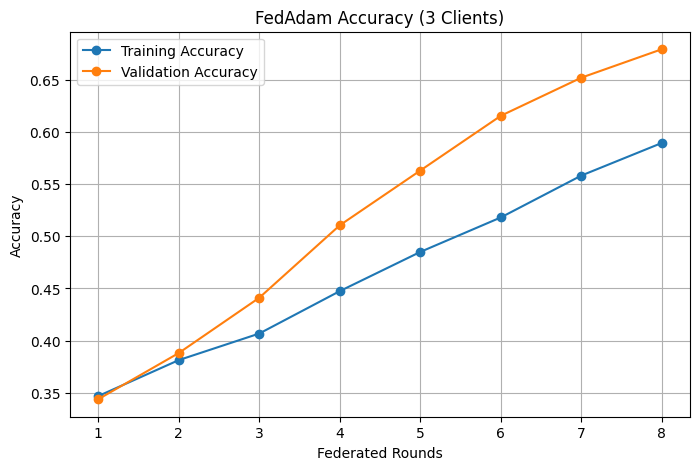

In [55]:
import matplotlib.pyplot as plt

# ensure lists exist
print(len(train_acc_3), len(val_acc_3))  # debug

rounds = range(1, len(train_acc_3) + 1)

plt.figure(figsize=(8,5))

plt.plot(rounds, train_acc_3, marker='o', label='Training Accuracy')
plt.plot(rounds, val_acc_3, marker='o', label='Validation Accuracy')

plt.xlabel("Federated Rounds")
plt.ylabel("Accuracy")
plt.title("FedAdam Accuracy (3 Clients)")

plt.legend()
plt.grid()

plt.show()

61/61 ━━━━━━━━━━━━━━━━━━━━ 16s 179ms/step


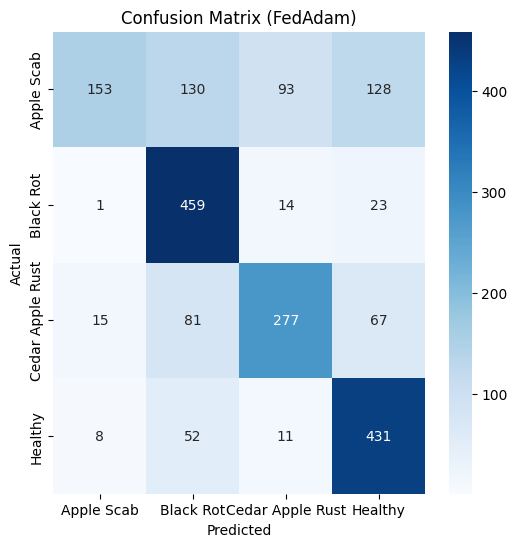

In [56]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# predictions
y_true = val_data.classes
y_pred_probs = fedadam_model_3.predict(val_data)
y_pred = np.argmax(y_pred_probs, axis=1)

# confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,6))

sns.heatmap(cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=list(val_data.class_indices.keys()),
            yticklabels=list(val_data.class_indices.keys()))

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (FedAdam)")

plt.show()

In [57]:
from sklearn.metrics import classification_report

print(classification_report(
    y_true,
    y_pred,
    target_names=list(val_data.class_indices.keys())
))

                  precision    recall  f1-score   support

      Apple Scab       0.86      0.30      0.45       504
       Black Rot       0.64      0.92      0.75       497
Cedar Apple Rust       0.70      0.63      0.66       440
         Healthy       0.66      0.86      0.75       502

        accuracy                           0.68      1943
       macro avg       0.72      0.68      0.65      1943
    weighted avg       0.72      0.68      0.65      1943



In [58]:
clients_9_fedadam = create_clients(train_data, num_clients=9)

In [59]:
fedadam_model_3, train_acc_3, val_acc_3 = fedadam_train(
    clients_9_fedadam,
    rounds=8,
    local_epochs=1
)


--- Round 1 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 1 → Train Acc: 0.2787, Val Acc: 0.2769

--- Round 2 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 2 → Train Acc: 0.3160, Val Acc: 0.3212

--- Round 3 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
Round 3 → Train Acc: 0.3630, Val Acc: 0.3736

--- Round 4 (FedAdam) ---
Client 1 training...
Client 2 training...
Client 3 training...
Client 4 training...
Client 5 training...
Client 6 training...
Client 7 training...
Client 8 training...
Client 9 training...
R

In [60]:
loss, acc = fedadam_model_3.evaluate(val_data)
print("FedAdam Accuracy:", acc)

61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.8041 - loss: 0.9389
FedAdam Accuracy: 0.7498713135719299


8 8


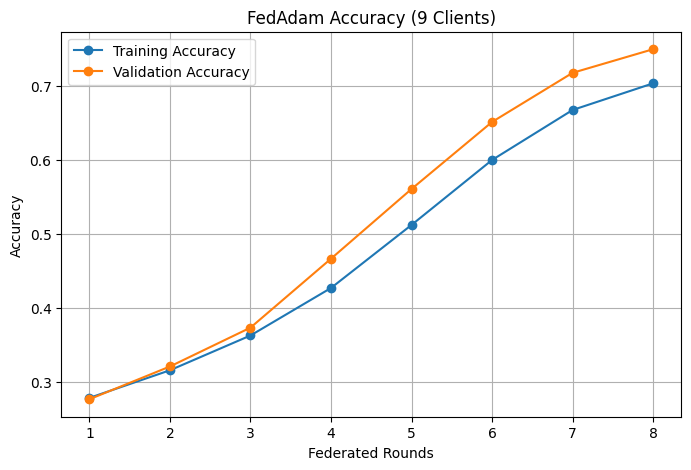

In [61]:
import matplotlib.pyplot as plt

# ensure lists exist
print(len(train_acc_3), len(val_acc_3))  # debug

rounds = range(1, len(train_acc_3) + 1)

plt.figure(figsize=(8,5))

plt.plot(rounds, train_acc_3, marker='o', label='Training Accuracy')
plt.plot(rounds, val_acc_3, marker='o', label='Validation Accuracy')

plt.xlabel("Federated Rounds")
plt.ylabel("Accuracy")
plt.title("FedAdam Accuracy (9 Clients)")

plt.legend()
plt.grid()

plt.show()

61/61 ━━━━━━━━━━━━━━━━━━━━ 17s 187ms/step


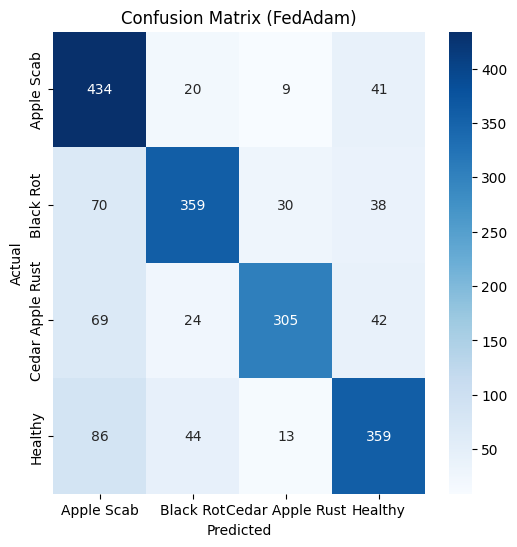

In [62]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# predictions
y_true = val_data.classes
y_pred_probs = fedadam_model_3.predict(val_data)
y_pred = np.argmax(y_pred_probs, axis=1)

# confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,6))

sns.heatmap(cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=list(val_data.class_indices.keys()),
            yticklabels=list(val_data.class_indices.keys()))

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (FedAdam)")

plt.show()

In [63]:
from sklearn.metrics import classification_report

print(classification_report(
    y_true,
    y_pred,
    target_names=list(val_data.class_indices.keys())
))

                  precision    recall  f1-score   support

      Apple Scab       0.66      0.86      0.75       504
       Black Rot       0.80      0.72      0.76       497
Cedar Apple Rust       0.85      0.69      0.77       440
         Healthy       0.75      0.72      0.73       502

        accuracy                           0.75      1943
       macro avg       0.77      0.75      0.75      1943
    weighted avg       0.76      0.75      0.75      1943

